In [1]:
from data import dutils

total_seq_len = 13 + 12
train_loader = dutils.SEVIRDataLoader('fused', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, \
                                      end_date=dutils.SEVIR_TRAIN_TEST_SPLIT_DATE, rescale_method='01')
test_loader = dutils.SEVIRDataLoader('fused', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, \
                                     start_date=dutils.SEVIR_TRAIN_TEST_SPLIT_DATE, rescale_method='01')    

/home/pyadav/.conda/envs/facl/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
print(len(train_loader), len(test_loader))
for i, data in enumerate(train_loader):
    print(i, data.keys())
    print("VIL shape:", data['vil'].shape)
    print("VIL range:", data['vil'].min().item(), "to", data['vil'].max().item())
    print("VIS shape:", data['vis'].shape) 
    print("VIS range:", data['vis'].min().item(), "to", data['vis'].max().item())
    print("IR069 shape:", data['ir069'].shape)
    print("IR069 range:", data['ir069'].min().item(), "to", data['ir069'].max().item())
    print("IR107 shape:", data['ir107'].shape)
    print("IR107 range:", data['ir107'].min().item(), "to", data['ir107'].max().item())
    print("LGHT shape:", data['lght'].shape)
    print("LGHT range:", data['lght'].min().item(), "to", data['lght'].max().item())
    break

for i, data in enumerate(test_loader):
    print(i, data.keys())
    print("VIL shape:", data['vil'].shape)
    print("VIL range:", data['vil'].min().item(), "to", data['vil'].max().item())
    print("VIS shape:", data['vis'].shape)
    print("VIS range:", data['vis'].min().item(), "to", data['vis'].max().item()) 
    print("IR069 shape:", data['ir069'].shape)
    print("IR069 range:", data['ir069'].min().item(), "to", data['ir069'].max().item())
    print("IR107 shape:", data['ir107'].shape)
    print("IR107 range:", data['ir107'].min().item(), "to", data['ir107'].max().item())
    print("LGHT shape:", data['lght'].shape)
    print("LGHT range:", data['lght'].min().item(), "to", data['lght'].max().item())
    break

2081 772
0 dict_keys(['mask', 'vil', 'vis', 'ir069', 'ir107', 'lght'])
VIL shape: torch.Size([4, 25, 1, 192, 192])
VIL range: 0.0 to 0.7166666984558105
VIS shape: torch.Size([4, 25, 1, 192, 192])
VIS range: 318.6875 to 8164.375
IR069 shape: torch.Size([4, 25, 1, 192, 192])
IR069 range: -6381.0 to -3297.0
IR107 shape: torch.Size([4, 25, 1, 192, 192])
IR107 range: -6204.0 to 1548.0
LGHT shape: torch.Size([4, 25, 1, 192, 192])
LGHT range: 0.0 to 1.0
0 dict_keys(['mask', 'vil', 'vis', 'ir069', 'ir107', 'lght'])
VIL shape: torch.Size([4, 25, 1, 192, 192])
VIL range: 0.0 to 0.895098090171814
VIS shape: torch.Size([4, 25, 1, 192, 192])
VIS range: 170.75 to 10579.375
IR069 shape: torch.Size([4, 25, 1, 192, 192])
IR069 range: -6802.0 to -1809.0
IR107 shape: torch.Size([4, 25, 1, 192, 192])
IR107 range: -6208.0 to 3535.0
LGHT shape: torch.Size([4, 25, 1, 192, 192])
LGHT range: 0.0 to 27.0


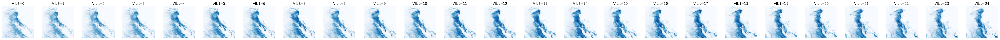

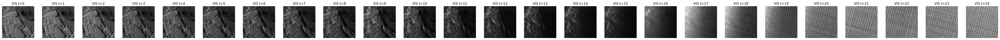

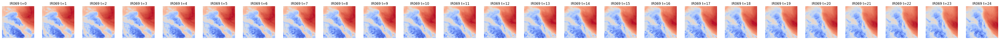

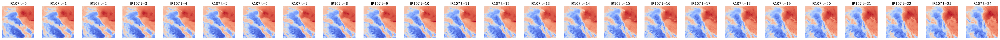

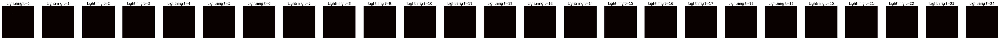

In [3]:
import matplotlib.pyplot as plt
import numpy as np

for i, data in enumerate(train_loader):
    # Visualize all data types for the first sample in the batch
    idx = 0  # first sample in batch
    
    # Helper to plot a sequence of images
    def plot_sequence(arr, title, cmap='viridis', vmin=None, vmax=None):
        n_frames = arr.shape[0]
        fig, axes = plt.subplots(1, n_frames, figsize=(2*n_frames, 2))
        if n_frames == 1:
            axes = [axes]
        for j in range(n_frames):
            axes[j].imshow(arr[j], cmap=cmap, vmin=vmin, vmax=vmax)
            axes[j].set_title(f"{title} t={j}")
            axes[j].axis('off')
        plt.tight_layout()
        plt.show()

    # VIL (Vertically Integrated Liquid) - Use Blues colormap
    vil = data['vil'][idx]
    if vil.ndim == 4:
        vil = vil[:, 0]
    plot_sequence(vil, "VIL", cmap='Blues')

    # VIS (Visible) - Use gray colormap
    vis = data['vis'][idx]
    if vis.ndim == 4:
        vis = vis[:, 0]
    plot_sequence(vis, "VIS", cmap='gray')

    # IR069 (Infrared 6.9μm) - Use coolwarm colormap for temperature
    ir069 = data['ir069'][idx]
    if ir069.ndim == 4:
        ir069 = ir069[:, 0]
    plot_sequence(ir069, "IR069", cmap='coolwarm')

    # IR107 (Infrared 10.7μm) - Use coolwarm colormap for temperature
    ir107 = data['ir107'][idx]
    if ir107.ndim == 4:
        ir107 = ir107[:, 0]
    plot_sequence(ir107, "IR107", cmap='coolwarm')

    # Lightning - Use hot colormap for intensity
    lght = data['lght'][idx]
    if lght.ndim == 4:
        lght = lght[:, 0]
    plot_sequence(lght, "Lightning", cmap='hot')

    break

In [4]:
from data import dutils

total_seq_len = 13 + 12
train_loader = dutils.SEVIRDataLoader('fused', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, \
                                      end_date=dutils.SEVIR_TRAIN_TEST_SPLIT_DATE, rescale_method='sevir')
test_loader = dutils.SEVIRDataLoader('fused', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, \
                                     start_date=dutils.SEVIR_TRAIN_TEST_SPLIT_DATE, rescale_method='sevir')    

In [5]:
print(len(train_loader), len(test_loader))
for i, data in enumerate(train_loader):
    print(i, data.keys())
    print("VIL shape:", data['vil'].shape)
    print("VIL range:", data['vil'].min().item(), "to", data['vil'].max().item())
    print("VIS shape:", data['vis'].shape) 
    print("VIS range:", data['vis'].min().item(), "to", data['vis'].max().item())
    print("IR069 shape:", data['ir069'].shape)
    print("IR069 range:", data['ir069'].min().item(), "to", data['ir069'].max().item())
    print("IR107 shape:", data['ir107'].shape)
    print("IR107 range:", data['ir107'].min().item(), "to", data['ir107'].max().item())
    print("LGHT shape:", data['lght'].shape)
    print("LGHT range:", data['lght'].min().item(), "to", data['lght'].max().item())
    break

for i, data in enumerate(test_loader):
    print(i, data.keys())
    print("VIL shape:", data['vil'].shape)
    print("VIL range:", data['vil'].min().item(), "to", data['vil'].max().item())
    print("VIS shape:", data['vis'].shape)
    print("VIS range:", data['vis'].min().item(), "to", data['vis'].max().item()) 
    print("IR069 shape:", data['ir069'].shape)
    print("IR069 range:", data['ir069'].min().item(), "to", data['ir069'].max().item())
    print("IR107 shape:", data['ir107'].shape)
    print("IR107 range:", data['ir107'].min().item(), "to", data['ir107'].max().item())
    print("LGHT shape:", data['lght'].shape)
    print("LGHT range:", data['lght'].min().item(), "to", data['lght'].max().item())
    break

2081 772
0 dict_keys(['mask', 'vil', 'vis', 'ir069', 'ir107', 'lght'])
VIL shape: torch.Size([4, 25, 1, 192, 192])
VIL range: -0.7034076452255249 to 3.140723705291748
VIS shape: torch.Size([4, 25, 1, 192, 192])
VIS range: 318.6875 to 8164.375
IR069 shape: torch.Size([4, 25, 1, 192, 192])
IR069 range: -2.29630184173584 to 0.32909393310546875
IR107 shape: torch.Size([4, 25, 1, 192, 192])
IR107 range: -1.8151521682739258 to 1.2101013660430908
LGHT shape: torch.Size([4, 25, 1, 192, 192])
LGHT range: -0.049407605081796646 to 1.6030206680297852
0 dict_keys(['mask', 'vil', 'vis', 'ir069', 'ir107', 'lght'])
VIL shape: torch.Size([4, 25, 1, 192, 192])
VIL range: -0.7034076452255249 to 4.097812652587891
VIS shape: torch.Size([4, 25, 1, 192, 192])
VIS range: 170.75 to 10579.375
IR069 shape: torch.Size([4, 25, 1, 192, 192])
IR069 range: -2.6546974182128906 to 1.5958218574523926
IR107 shape: torch.Size([4, 25, 1, 192, 192])
IR107 range: -1.8167132139205933 to 1.9855371713638306
LGHT shape: torch.Si

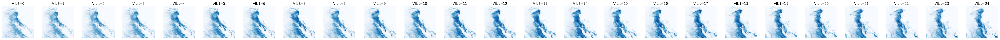

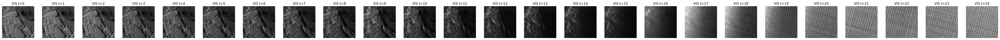

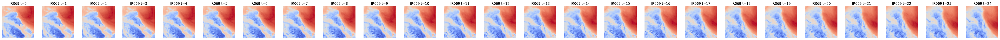

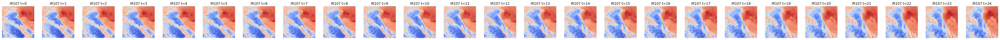

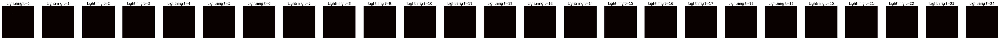

In [6]:
import matplotlib.pyplot as plt
import numpy as np

for i, data in enumerate(train_loader):
    # Visualize all data types for the first sample in the batch
    idx = 0  # first sample in batch
    
    # Helper to plot a sequence of images
    def plot_sequence(arr, title, cmap='viridis', vmin=None, vmax=None):
        n_frames = arr.shape[0]
        fig, axes = plt.subplots(1, n_frames, figsize=(2*n_frames, 2))
        if n_frames == 1:
            axes = [axes]
        for j in range(n_frames):
            axes[j].imshow(arr[j], cmap=cmap, vmin=vmin, vmax=vmax)
            axes[j].set_title(f"{title} t={j}")
            axes[j].axis('off')
        plt.tight_layout()
        plt.show()

    # VIL (Vertically Integrated Liquid) - Use Blues colormap
    vil = data['vil'][idx]
    if vil.ndim == 4:
        vil = vil[:, 0]
    plot_sequence(vil, "VIL", cmap='Blues')

    # VIS (Visible) - Use gray colormap
    vis = data['vis'][idx]
    if vis.ndim == 4:
        vis = vis[:, 0]
    plot_sequence(vis, "VIS", cmap='gray')

    # IR069 (Infrared 6.9μm) - Use coolwarm colormap for temperature
    ir069 = data['ir069'][idx]
    if ir069.ndim == 4:
        ir069 = ir069[:, 0]
    plot_sequence(ir069, "IR069", cmap='coolwarm')

    # IR107 (Infrared 10.7μm) - Use coolwarm colormap for temperature
    ir107 = data['ir107'][idx]
    if ir107.ndim == 4:
        ir107 = ir107[:, 0]
    plot_sequence(ir107, "IR107", cmap='coolwarm')

    # Lightning - Use hot colormap for intensity
    lght = data['lght'][idx]
    if lght.ndim == 4:
        lght = lght[:, 0]
    plot_sequence(lght, "Lightning", cmap='hot')

    break

In [ ]:
from data import dutils
import torch

total_seq_len = 13 + 12
# Create dataloader without train/test split by not specifying start/end dates
loader = dutils.SEVIRDataLoader('fused', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, rescale_method=None)

# Initialize variables to store sums, squared sums, counts, min, and max
sums = {'vil': torch.tensor(0.), 'vis': torch.tensor(0.), 'ir069': torch.tensor(0.), 'ir107': torch.tensor(0.), 'lght': torch.tensor(0.)}
squared_sums = {'vil': torch.tensor(0.), 'vis': torch.tensor(0.), 'ir069': torch.tensor(0.), 'ir107': torch.tensor(0.), 'lght': torch.tensor(0.)}
counts = {'vil': 0, 'vis': 0, 'ir069': 0, 'ir107': 0, 'lght': 0}
mins = {'vil': None, 'vis': None, 'ir069': None, 'ir107': None, 'lght': None}
maxs = {'vil': None, 'vis': None, 'ir069': None, 'ir107': None, 'lght': None}

print("Calculating statistics across entire dataset...")
for i, data in enumerate(loader):
    if i % 100 == 0:
        print(f"Processing batch {i}")
    
    for key in data.keys():
        if key == 'mask':
            continue
        batch_data = data[key]
        sums[key] += torch.sum(batch_data)
        squared_sums[key] += torch.sum(batch_data**2)
        counts[key] += batch_data.numel()
        batch_min = batch_data.min()
        batch_max = batch_data.max()
        if mins[key] is None:
            mins[key] = batch_min
        else:
            mins[key] = torch.minimum(mins[key], batch_min)
        if maxs[key] is None:
            maxs[key] = batch_max
        else:
            maxs[key] = torch.maximum(maxs[key], batch_max)

# Calculate means and variances
means = {}
variances = {}
for key in sums.keys():
    means[key] = sums[key] / counts[key]
    variances[key] = (squared_sums[key] / counts[key]) - (means[key]**2)

print("\nDataset Statistics:")
print("Means:")
for key in means:
    print(f"{key}: {means[key].item():.6f}")
print("\nVariances:")
for key in variances:
    print(f"{key}: {variances[key].item():.6f}")
print("\nMinimums:")
for key in mins:
    print(f"{key}: {mins[key].item():.6f}")
print("\nMaximums:")
for key in maxs:
    print(f"{key}: {maxs[key].item():.6f}")

/home/pyadav/.conda/envs/facl/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Calculating statistics across entire dataset...
Processing batch 0
Processing batch 100
Processing batch 200
Processing batch 300
Processing batch 400
Processing batch 500
Processing batch 600
Processing batch 700
Processing batch 800
Processing batch 900
Processing batch 1000
Processing batch 1100
Processing batch 1200
Processing batch 1300
Processing batch 1400
Processing batch 1500
Processing batch 1600
Processing batch 1700
Processing batch 1800
Processing batch 1900
Processing batch 2000


In [ ]:
from data import dutils

total_seq_len = 13 + 12
train_loader = dutils.SEVIRDataLoader('rad', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, \
                                      end_date=dutils.SEVIR_TRAIN_TEST_SPLIT_DATE, rescale_method='stats')
test_loader = dutils.SEVIRDataLoader('rad', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, \
                                     start_date=dutils.SEVIR_TRAIN_TEST_SPLIT_DATE, rescale_method='stats')    

In [ ]:
print(len(train_loader), len(test_loader))
for i, data in enumerate(train_loader):
    print(i, data.keys())
    print("VIL shape:", data['vil'].shape)
    print("VIL range:", data['vil'].min().item(), "to", data['vil'].max().item())
    break

for i, data in enumerate(test_loader):
    print(i, data.keys())
    print("VIL shape:", data['vil'].shape)
    print("VIL range:", data['vil'].min().item(), "to", data['vil'].max().item())
    break

3731 1013
0 dict_keys(['mask', 'vil'])
VIL shape: torch.Size([4, 25, 1, 384, 384])
VIL range: -0.5100979208946228 to 1773.7191162109375
0 dict_keys(['mask', 'vil'])
VIL shape: torch.Size([4, 25, 1, 384, 384])
VIL range: -0.5100979208946228 to 1773.7191162109375


In [ ]:
from data import dutils

total_seq_len = 13 + 12
train_loader = dutils.SEVIRDataLoader('co', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, \
                                      end_date=dutils.SEVIR_TRAIN_TEST_SPLIT_DATE, rescale_method='stats')
test_loader = dutils.SEVIRDataLoader('co', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, \
                                     start_date=dutils.SEVIR_TRAIN_TEST_SPLIT_DATE, rescale_method='stats')    

In [ ]:
print(len(train_loader), len(test_loader))
for i, data in enumerate(train_loader):
    print(i, data.keys())
    print("VIL shape:", data['vil'].shape)
    print("VIL range:", data['vil'].min().item(), "to", data['vil'].max().item())
    print("VIS shape:", data['vis'].shape) 
    print("VIS range:", data['vis'].min().item(), "to", data['vis'].max().item())
    print("IR069 shape:", data['ir069'].shape)
    print("IR069 range:", data['ir069'].min().item(), "to", data['ir069'].max().item())
    print("IR107 shape:", data['ir107'].shape)
    print("IR107 range:", data['ir107'].min().item(), "to", data['ir107'].max().item())
    print("LGHT shape:", data['lght'].shape)
    print("LGHT range:", data['lght'].min().item(), "to", data['lght'].max().item())
    break

for i, data in enumerate(test_loader):
    print(i, data.keys())
    print("VIL shape:", data['vil'].shape)
    print("VIL range:", data['vil'].min().item(), "to", data['vil'].max().item())
    print("VIS shape:", data['vis'].shape)
    print("VIS range:", data['vis'].min().item(), "to", data['vis'].max().item()) 
    print("IR069 shape:", data['ir069'].shape)
    print("IR069 range:", data['ir069'].min().item(), "to", data['ir069'].max().item())
    print("IR107 shape:", data['ir107'].shape)
    print("IR107 range:", data['ir107'].min().item(), "to", data['ir107'].max().item())
    print("LGHT shape:", data['lght'].shape)
    print("LGHT range:", data['lght'].min().item(), "to", data['lght'].max().item())
    break

2081 772
0 dict_keys(['mask', 'vil', 'vis', 'ir069', 'ir107', 'lght'])
VIL shape: torch.Size([4, 25, 1, 192, 192])
VIL range: -0.5100979208946228 to 1312.698974609375
VIS shape: torch.Size([4, 25, 1, 192, 192])
VIS range: -0.5413378477096558 to 3.29999041557312
IR069 shape: torch.Size([4, 25, 1, 192, 192])
IR069 range: -2.338022470474243 to 0.2872023284435272
IR107 shape: torch.Size([4, 25, 1, 192, 192])
IR107 range: -1.840354084968567 to 1.123155951499939
LGHT shape: torch.Size([4, 25, 1, 192, 192])
LGHT range: -0.050244491547346115 to 1.4632350206375122
0 dict_keys(['mask', 'vil', 'vis', 'ir069', 'ir107', 'lght'])
VIL shape: torch.Size([4, 25, 1, 192, 192])
VIL range: -0.5100979208946228 to 1641.001220703125
VIS shape: torch.Size([4, 25, 1, 192, 192])
VIS range: -0.6137694716453552 to 4.482398986816406
IR069 shape: torch.Size([4, 25, 1, 192, 192])
IR069 range: -2.696394443511963 to 1.5538476705551147
IR107 shape: torch.Size([4, 25, 1, 192, 192])
IR107 range: -1.8418833017349243 to 1.

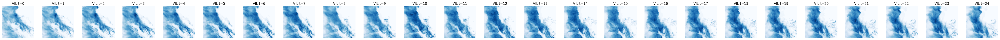

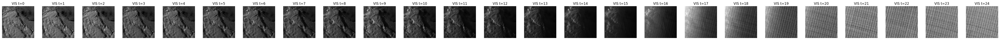

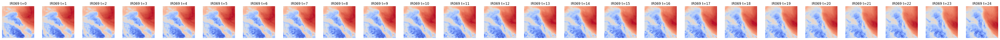

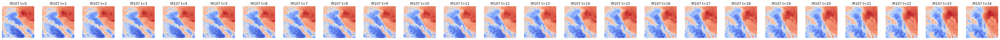

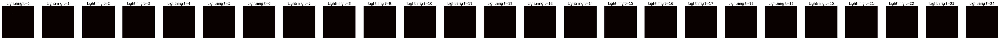

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

for i, data in enumerate(train_loader):
    # Visualize all data types for the first sample in the batch
    idx = 0  # first sample in batch
    
    # Helper to plot a sequence of images
    def plot_sequence(arr, title, cmap='viridis', vmin=None, vmax=None):
        n_frames = arr.shape[0]
        fig, axes = plt.subplots(1, n_frames, figsize=(2*n_frames, 2))
        if n_frames == 1:
            axes = [axes]
        for j in range(n_frames):
            axes[j].imshow(arr[j], cmap=cmap, vmin=vmin, vmax=vmax)
            axes[j].set_title(f"{title} t={j}")
            axes[j].axis('off')
        plt.tight_layout()
        plt.show()

    # VIL (Vertically Integrated Liquid) - Use Blues colormap
    vil = data['vil'][idx]
    if vil.ndim == 4:
        vil = vil[:, 0]
    plot_sequence(vil, "VIL", cmap='Blues')

    # VIS (Visible) - Use gray colormap
    vis = data['vis'][idx]
    if vis.ndim == 4:
        vis = vis[:, 0]
    plot_sequence(vis, "VIS", cmap='gray')

    # IR069 (Infrared 6.9μm) - Use coolwarm colormap for temperature
    ir069 = data['ir069'][idx]
    if ir069.ndim == 4:
        ir069 = ir069[:, 0]
    plot_sequence(ir069, "IR069", cmap='coolwarm')

    # IR107 (Infrared 10.7μm) - Use coolwarm colormap for temperature
    ir107 = data['ir107'][idx]
    if ir107.ndim == 4:
        ir107 = ir107[:, 0]
    plot_sequence(ir107, "IR107", cmap='coolwarm')

    # Lightning - Use hot colormap for intensity
    lght = data['lght'][idx]
    if lght.ndim == 4:
        lght = lght[:, 0]
    plot_sequence(lght, "Lightning", cmap='hot')

    break

In [1]:
from data import dutils

total_seq_len = 13 + 12
train_loader = dutils.SEVIRDataLoader('co', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, \
                                      end_date=dutils.SEVIR_TRAIN_TEST_SPLIT_DATE, rescale_method='guess')
test_loader = dutils.SEVIRDataLoader('co', layout='NTCHW', seq_len=total_seq_len, raw_seq_len=total_seq_len, batch_size=4, \
                                     start_date=dutils.SEVIR_TRAIN_TEST_SPLIT_DATE, rescale_method='guess')    

/home/pyadav/.conda/envs/facl/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
print(len(train_loader), len(test_loader))
for i, data in enumerate(train_loader):
    print(i, data.keys())
    print("VIL shape:", data['vil'].shape)
    print("VIL range:", data['vil'].min().item(), "to", data['vil'].max().item())
    print("VIS shape:", data['vis'].shape) 
    print("VIS range:", data['vis'].min().item(), "to", data['vis'].max().item())
    print("IR069 shape:", data['ir069'].shape)
    print("IR069 range:", data['ir069'].min().item(), "to", data['ir069'].max().item())
    print("IR107 shape:", data['ir107'].shape)
    print("IR107 range:", data['ir107'].min().item(), "to", data['ir107'].max().item())
    print("LGHT shape:", data['lght'].shape)
    print("LGHT range:", data['lght'].min().item(), "to", data['lght'].max().item())
    break

for i, data in enumerate(test_loader):
    print(i, data.keys())
    print("VIL shape:", data['vil'].shape)
    print("VIL range:", data['vil'].min().item(), "to", data['vil'].max().item())
    print("VIS shape:", data['vis'].shape)
    print("VIS range:", data['vis'].min().item(), "to", data['vis'].max().item()) 
    print("IR069 shape:", data['ir069'].shape)
    print("IR069 range:", data['ir069'].min().item(), "to", data['ir069'].max().item())
    print("IR107 shape:", data['ir107'].shape)
    print("IR107 range:", data['ir107'].min().item(), "to", data['ir107'].max().item())
    print("LGHT shape:", data['lght'].shape)
    print("LGHT range:", data['lght'].min().item(), "to", data['lght'].max().item())
    break

2081 772
0 dict_keys(['mask', 'vil', 'vis', 'ir069', 'ir107', 'lght'])
VIL shape: torch.Size([4, 25, 1, 192, 192])
VIL range: 0.0 to 0.7372549176216125
VIS shape: torch.Size([4, 25, 1, 192, 192])
VIS range: 0.03186874836683273 to 0.8164374828338623
IR069 shape: torch.Size([4, 25, 1, 192, 192])
IR069 range: 0.1547500044107437 to 0.9257500171661377
IR107 shape: torch.Size([4, 25, 1, 192, 192])
IR107 range: 0.07959999889135361 to 0.8547999858856201
LGHT shape: torch.Size([4, 25, 1, 192, 192])
LGHT range: 0.0 to 0.03333333507180214
0 dict_keys(['mask', 'vil', 'vis', 'ir069', 'ir107', 'lght'])
VIL shape: torch.Size([4, 25, 1, 192, 192])
VIL range: 0.0 to 0.9215686917304993
VIS shape: torch.Size([4, 25, 1, 192, 192])
VIS range: 0.01707500033080578 to 1.057937502861023
IR069 shape: torch.Size([4, 25, 1, 192, 192])
IR069 range: 0.0495000034570694 to 1.2977501153945923
IR107 shape: torch.Size([4, 25, 1, 192, 192])
IR107 range: 0.07919999957084656 to 1.0534999370574951
LGHT shape: torch.Size([4,

In [3]:
x, y = data['vil'][:, :13], data['vil'][:, 13:] 
print(x.shape, y.shape)

torch.Size([4, 13, 1, 192, 192]) torch.Size([4, 12, 1, 192, 192])


In [17]:
import torch
x = torch.cat([
                        data['vil'][:, :13],
                        data['vis'][:, :13],
                        data['ir069'][:, :13],
                        data['ir107'][:, :13],
                        data['lght'][:, :13]
                    ], dim=2)  # shape: (batch, T, C=5, H, W)
y = data['vil'][:, 13:]
print(x.shape, y.shape)
x_temp = x[:, :, 0:1, :, :]
print(x_temp.shape)
y_pred = y

torch.Size([4, 13, 5, 192, 192]) torch.Size([4, 12, 1, 192, 192])
torch.Size([4, 13, 1, 192, 192])


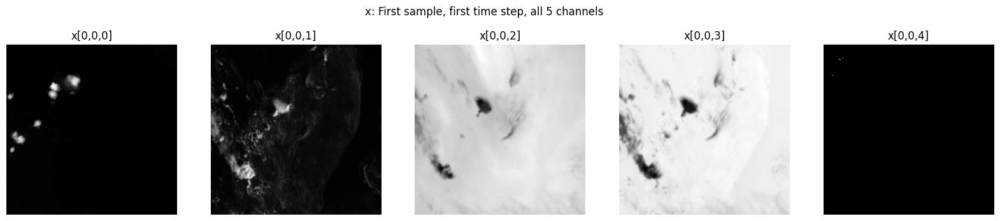

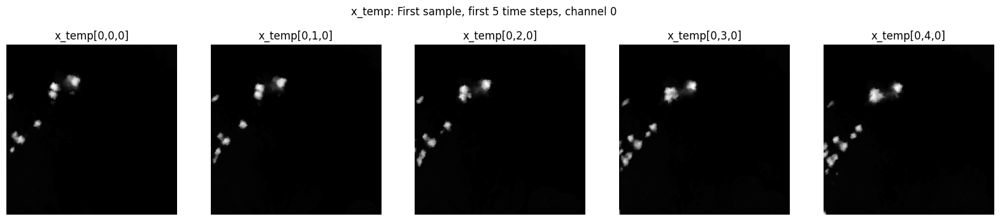

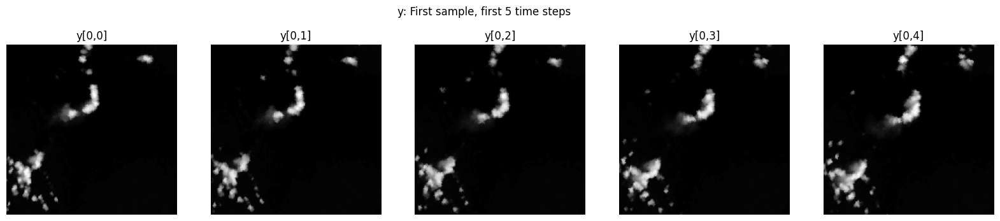

In [18]:
import matplotlib.pyplot as plt

# Visualize x (all 5 channels for first sample and first time step)
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for i in range(5):
    axes[i].imshow(x[0, 0, i].cpu(), cmap='gray')
    axes[i].set_title(f'x[0,0,{i}]')
    axes[i].axis('off')
plt.suptitle('x: First sample, first time step, all 5 channels')
plt.show()

# Visualize x_temp (should be same as x[..., 0])
fig, axes = plt.subplots(1, min(5, x_temp.shape[1]), figsize=(20, 4))
for t in range(min(5, x_temp.shape[1])):
    axes[t].imshow(x_temp[0, t, 0].cpu(), cmap='gray')
    axes[t].set_title(f'x_temp[0,{t},0]')
    axes[t].axis('off')
plt.suptitle('x_temp: First sample, first 5 time steps, channel 0')
plt.show()

# Visualize y (first sample, first 5 time steps)
fig, axes = plt.subplots(1, min(5, y.shape[1]), figsize=(20, 4))
for t in range(min(5, y.shape[1])):
    axes[t].imshow(y[0, t, 0].cpu(), cmap='gray')
    axes[t].set_title(f'y[0,{t}]')
    axes[t].axis('off')
plt.suptitle('y: First sample, first 5 time steps')
plt.show()

In [19]:
rand_batch = 2
out_x, out_y, out_y_pred = x_temp[rand_batch].unsqueeze(0), y[rand_batch].unsqueeze(0), y_pred[rand_batch].unsqueeze(0)

In [20]:
import utilspp as utpp
utpp.torch_visualize({'input': out_x, 'ground truth': out_y, 'predicted': out_y_pred}, savedir=f'temp.png')